In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

images = np.load('data/images_quad_77.npy')
target = pd.read_csv('data/quad77_labels.csv', index_col=0)

In [2]:
target.head()

,id,x_p,y_p,radius_p
0,77_1111,94.0,75.0,5.0
1,77_2416,157.0,163.0,5.0
2,77_2883,218.0,109.0,5.0
3,77_2961,44.0,109.0,5.0
4,77_3193,192.0,158.0,5.0


In [3]:
from skimage.io import imshow
from skimage.color import gray2rgb
from skimage.draw import circle_perimeter

COLOR_CIRCLE = (220, 20, 20)

def plot_gt_circle(data, im_id):
    im = data[im_id]
    im_id_str = '77_{}'.format(im_id)
    craters = target[target['id'] == im_id_str]
    im_rgb = gray2rgb(im)
    
    for row in craters.itertuples():
        x, y, radius = int(row.x_p), int(row.y_p), int(row.radius_p)
        circle_y, circle_x = circle_perimeter(x, y, radius)
        im_rgb[circle_y, circle_x] = COLOR_CIRCLE
        
    imshow(im_rgb)

In [4]:
def get_gt(im_id):
    im_id_str = '77_{}'.format(im_id)
    craters = target[target['id'] == im_id_str]
    return [(row.x_p, row.y_p, row.radius_p) for row in craters.itertuples()]

In [5]:
X_train = [im for im in images]
y_train = [get_gt(i) for i in range(images.shape[0])]

In [95]:
from skimage.io import imshow
from skimage.color import gray2rgb
from skimage.draw import rectangle
from skimage.exposure import equalize_adapthist

COLOR_CIRCLE = (220, 20, 20)

def plot_gt_rectangle(data, im_id):
    im = data[im_id]
    im_id_str = '77_{}'.format(im_id)
    craters = target[target['id'] == im_id_str]
    im_rgb = gray2rgb(im)
    
    for row in craters.itertuples():
        x, y, radius = int(row.x_p), int(row.y_p), int(row.radius_p)
        rect_start = (x - radius, y - radius)
        rect_end = (x + radius, y + radius)
        rr, cc = rectangle(rect_start, rect_end)
        im_rgb[rr, cc] = COLOR_CIRCLE
        
    imshow(im_rgb)

In [83]:
from skimage.feature import blob_doh
from skimage.color import gray2rgb

def detect_blob(data, im_id):
    fig, ax = plt.subplots()
    im = data[im_id]
    blobs_doh = blob_doh(im, min_sigma=5, max_sigma=40, threshold=.01, overlap=0.5)
    im_rgb = gray2rgb(im)
    imshow(im_rgb, interpolation='nearest')
    for blob in blobs_doh:
        y, x, r = blob
        c = plt.Circle((x, y), r, color='r', linewidth=2, fill=False)
        ax.add_patch(c)
        print('here')
    plt.show()
    return blobs_doh

here
here
here
here
here
here


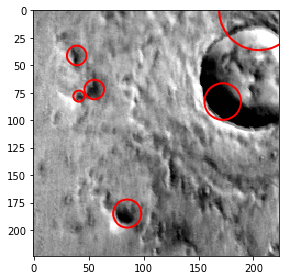

[ 185.           85.           12.77777778]
[  83.          172.           16.66666667]
[ 78.  41.   5.]
[ 72.          55.           8.88888889]
[ 41.          39.           8.88888889]
[   0.          205.           36.11111111]


In [84]:
a = detect_blob(X_train, 1000)
for b in a:
    print(b)

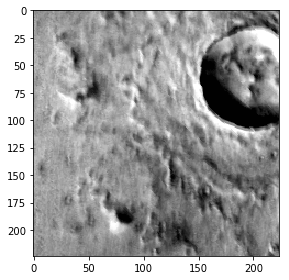

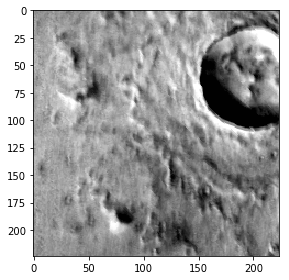

In [97]:
plt.figure()
plot_gt_rectangle(X_train, 1000)
plt.figure()
plot_gt_circle(X_train, 1000)

In [7]:
from submissions.image_processing.extraction import BlobExtractor

be = BlobExtractor()
be.fit_extract(X_train[1000])

([array([ 0.31830989,  0.02051257,  0.01304339,  0.01805048,  0.02869191,
          0.01457957,  0.01654071,  0.02825018,  0.04243478,  0.00803159,
          0.00412096,  0.0177022 ,  0.04594068,  0.02390933,  0.02550312,
          0.00692032,  0.02548876,  0.02444131,  0.00519085,  0.00619222,
          0.00605894,  0.01126383,  0.01973055,  0.01707295,  0.02467371]),
  array([ 0.31830989,  0.02754165,  0.01179152,  0.01599716,  0.01396033,
          0.01715837,  0.01488936,  0.0111359 ,  0.05359533,  0.01592103,
          0.01494859,  0.01085401,  0.03446973,  0.03089613,  0.02098169,
          0.01981277,  0.02440134,  0.01439467,  0.02612096,  0.00701239,
          0.01355139,  0.01163753,  0.0272096 ,  0.02272569,  0.01475261]),
  array([ 0.31830989,  0.03135279,  0.06827804,  0.01912589,  0.01175991,
          0.05000326,  0.03843545,  0.02531362,  0.03512966,  0.01223294,
          0.06654272,  0.0665721 ,  0.04494181,  0.04014279,  0.03980378,
          0.01380626,  0.01870129,

In [7]:
from submissions.image_processing.object_detector import CraterDetector

clf = CraterDetector()
clf.fit([X_train[1000]], [y_train[1000]])

In [8]:
clf.predict([X_train[1000]])

[[ 0.31830989  0.02051257  0.01304339  0.01805048  0.02869191  0.01457957
   0.01654071  0.02825018  0.04243478  0.00803159  0.00412096  0.0177022
   0.04594068  0.02390933  0.02550312  0.00692032  0.02548876  0.02444131
   0.00519085  0.00619222  0.00605894  0.01126383  0.01973055  0.01707295
   0.02467371]
 [ 0.31830989  0.02754165  0.01179152  0.01599716  0.01396033  0.01715837
   0.01488936  0.0111359   0.05359533  0.01592103  0.01494859  0.01085401
   0.03446973  0.03089613  0.02098169  0.01981277  0.02440134  0.01439467
   0.02612096  0.00701239  0.01355139  0.01163753  0.0272096   0.02272569
   0.01475261]
 [ 0.31830989  0.03135279  0.06827804  0.01912589  0.01175991  0.05000326
   0.03843545  0.02531362  0.03512966  0.01223294  0.06654272  0.0665721
   0.04494181  0.04014279  0.03980378  0.01380626  0.01870129  0.0888007
   0.08983357  0.05101339  0.0318294   0.07041953  0.06039485  0.02033771
   0.08889664]
 [ 0.31830989  0.01827341  0.02773989  0.042259    0.01644758  0.01787

NotFittedError: This BalancedBaggingClassifier instance is not fitted yet. Call 'fit' with appropriate arguments before using this method.

In [5]:
import warnings
from skimage.transform import resize

warnings.simplefilter("error", RuntimeWarning)

def crop_craters(data, im_id, padding=2.0):
    
    try:
        im = equalize_adapthist(data[im_id], nbins=8)
    except RuntimeWarning:
        # the equalization cannot be done for this image
        return []
    
    im_id_str = '77_{}'.format(im_id)
    craters = target[target['id'] == im_id_str]
    
    im_craters = []
    for row in craters.itertuples():
        x, y, radius = int(row.x_p), int(row.y_p), int(row.radius_p)
        padded_radius = int(padding * radius)
        
        x_min = x - padded_radius
        if x_min < 0:
            x_min = 0
        y_min = y - padded_radius
        if y_min < 0:
            y_min = 0
        x_max = x + padded_radius
        if x_max > im.shape[0]:
            x_max = im.shape[0] - 1
        y_max = y + padded_radius
        if y_max > im.shape[1]:
            y_max = im.shape[1] - 1
        
        crater = im[x_min:x_max, y_min:y_max]
        im_craters.append(resize(crater, (21, 21), order=5,
                                 mode='reflect', anti_aliasing=True))
        # im_craters.append(crater)
    
    return im_craters

In [6]:
x = [crop_craters(data, i) for i in range(data.shape[0])]

In [7]:
y = [x_i for x_i in x if x_i]

In [8]:
all_craters = np.concatenate(y)
all_craters = all_craters.reshape(all_craters.shape[0], -1)

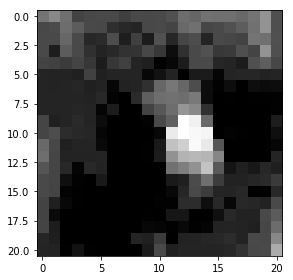

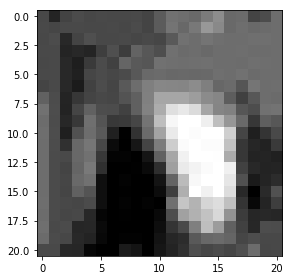

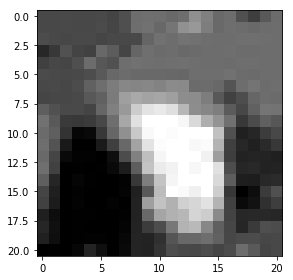

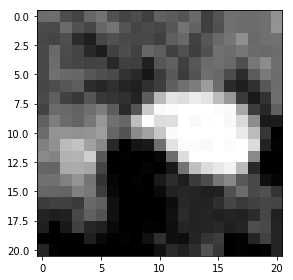

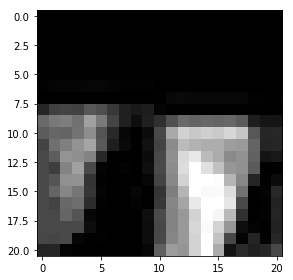

...

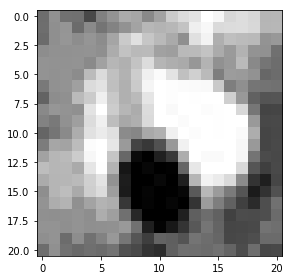

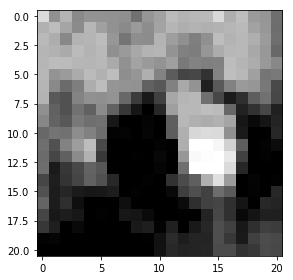

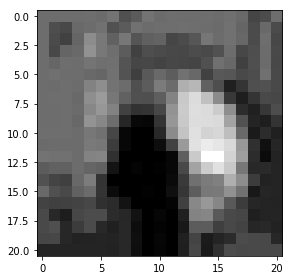

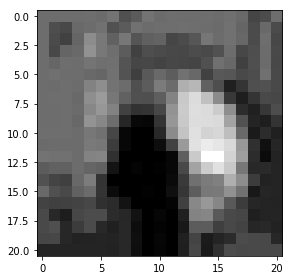

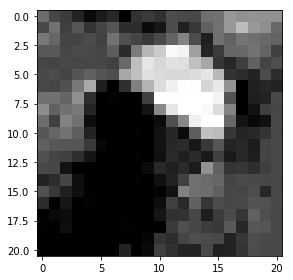

In [9]:
for i in range(15):
    plt.show()
    imshow(y[i][0])

In [10]:
from sklearn.decomposition import PCA

n_samples = all_craters.shape[0]

# global centering
all_craters_centered = all_craters - all_craters.mean(axis=0)

# local centering
all_craters_centered -= all_craters_centered.mean(axis=1).reshape(n_samples, -1)

pca = PCA(whiten=True, n_components=0.98)
pca.fit(all_craters)

PCA(copy=True, iterated_power='auto', n_components=0.98, random_state=None,
  svd_solver='auto', tol=0.0, whiten=True)

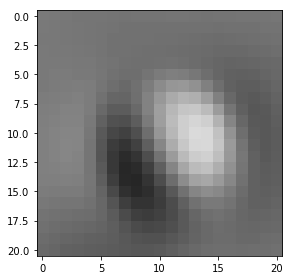

In [78]:
imshow(np.mean(all_craters, axis=0).reshape(21, 21))

In [35]:
pca.components_.shape

(441, 441)

In [ ]:
imshow(pca.mean_.reshape(21, 21))

In [ ]:
for i in range(32):
    plt.show()
    imshow(pca.components_[i].reshape(21, 21))

In [ ]:
plt.plot(pca.explained_variance_ratio_)

In [ ]:
weight = np.array([3] * len())

In [ ]:
xx = np.mean(all_craters, axis=0).reshape(21, 21)

for i in range(weight.shape[0]):
    xx += (pca.components_[i] * weight[i]).reshape(21, 21)

In [ ]:
imshow(xx)

In [ ]:
pca.transform(all_craters[400].reshape(1, -1).T).shape

In [ ]:
nComp = 2
Xhat = np.dot(pca.transform(all_craters[400].reshape(1, -1).T)[:,:nComp], pca.components_[:nComp,:])

In [ ]:
imshow(Xhat[10,].reshape(21, 21))

In [ ]:
plt.plot(pca.transform(all_craters[1].reshape(1, -1)).squeeze())

In [11]:
X_tran = pca.transform(all_craters)

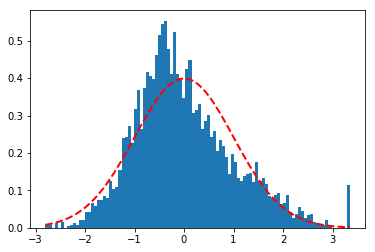

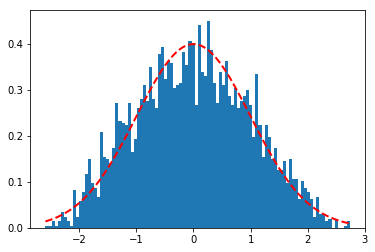

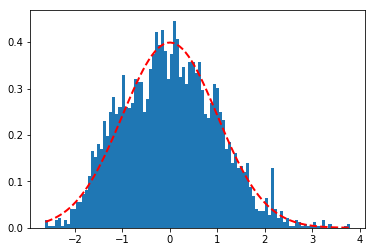

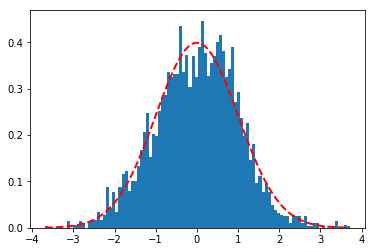

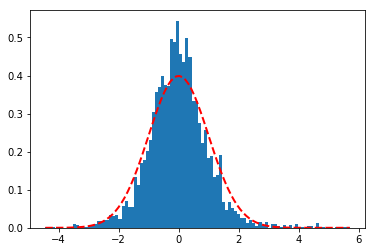

...

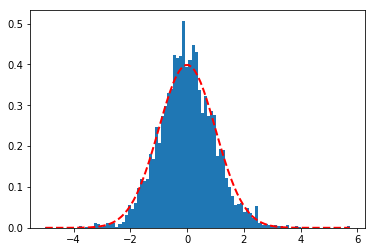

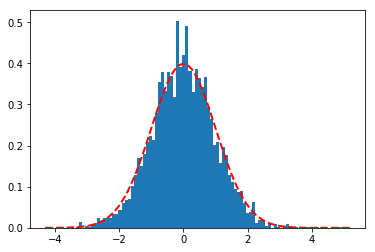

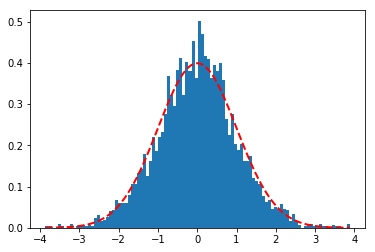

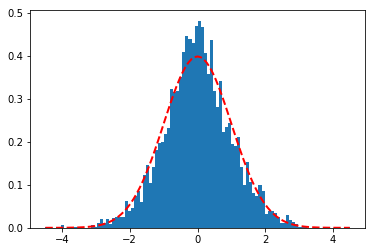

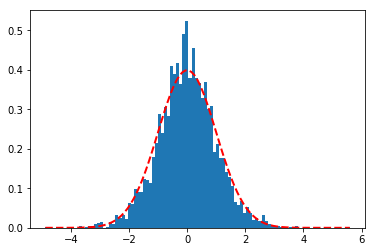

In [12]:
from scipy.stats import norm

mu_array = []
sigma_array = []

for i in range(X_tran.shape[1]):
    n, bins, patches = plt.hist(X_tran[:, i], bins=100, normed=True)
    mu, sigma = norm.fit(X_tran[:, i])
    mu_array.append(mu)
    sigma_array.append(sigma)
    y = norm.pdf(bins, mu, sigma)
    plt.plot(bins, y, 'r--', linewidth=2)
    plt.show()
    
mu_array = np.array(mu_array)
sigma_array = np.array(sigma_array)

In [81]:
mu_array.shape

(181,)

Create synthetic craters ...

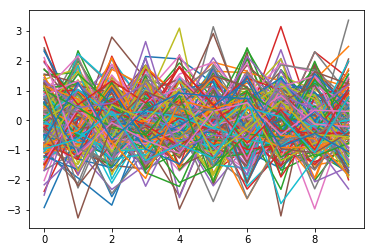

In [82]:
from numpy.random import randn

synthetic_craters_tran = sigma_array * randn(10, mu_array.size) + mu_array

plt.plot(synthetic_craters_tran)

In [83]:
synthetic_craters = pca.inverse_transform(synthetic_craters_tran)

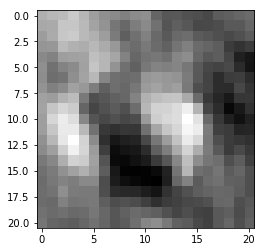

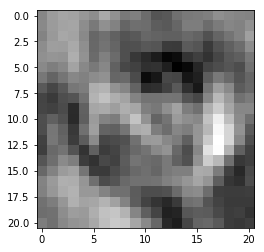

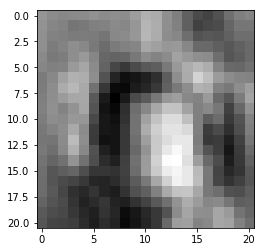

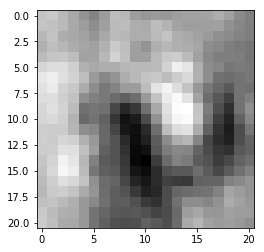

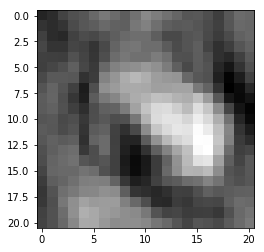

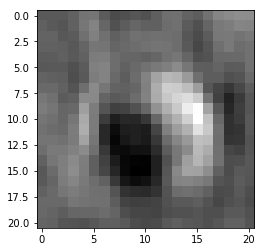

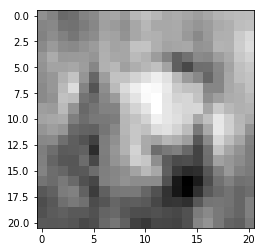

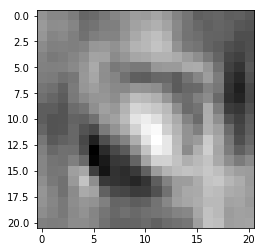

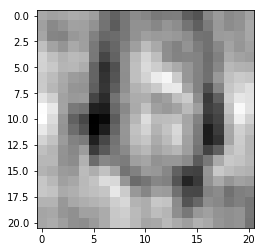

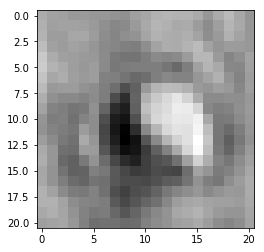

In [84]:
for i in range(synthetic_craters.shape[0]):
    yyyy = synthetic_craters[i, :].reshape(21, 21)
    vmin = np.min(yyyy)
    vmax = np.max(yyyy)
    plt.figure()
    plt.imshow(yyyy, vmin=vmin, vmax=vmax, cmap=plt.cm.gray)

In [15]:
from numpy.random import randn
n_synthetic_craters = 50
synthetic_craters_tran = sigma_array * randn(n_synthetic_craters, mu_array.size) + mu_array
synthetic_craters = pca.inverse_transform(synthetic_craters_tran)
synthetic_craters = synthetic_craters.reshape(n_synthetic_craters, 21, 21)

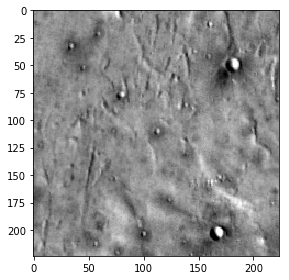

In [16]:
imshow(data[200])

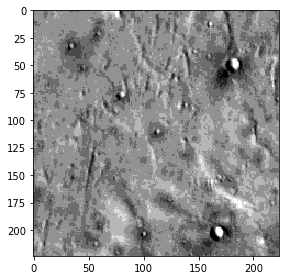

In [17]:
from scipy.signal import correlate2d
from scipy.signal import convolve2d
from skimage.transform import rotate

im = equalize_adapthist(data[200], nbins=8)
imshow(im)

crater_size = [(30, 30), (20, 20), (10, 10)]
angles = [0, 90, 180, 270]

max_correlation = []
for crater in synthetic_craters:
    for sz in crater_size:
        im_filter = resize(crater, sz, anti_aliasing=True, mode='reflect', order=1)
        for angle in angles:
            im_filter = rotate(im_filter, angle=angle, order=1)
            tmp_cor = correlate2d(im, im_filter, mode='same')
            tmp_cor /= np.median(tmp_cor)
            max_correlation.append(tmp_cor)

In [18]:
max_correlation[2].shape

(224, 224)

/home/lemaitre/Documents/code/toolbox/scikit-image/skimage/io/_plugins/matplotlib_plugin.py:80: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  warn("Float image out of standard range; displaying "


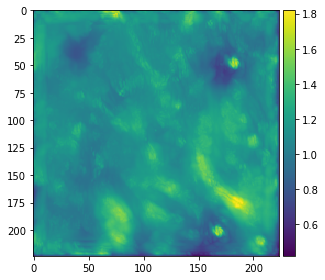

In [19]:
imshow(np.max(max_correlation, axis=0))

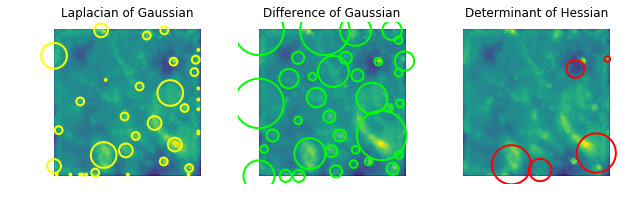

In [20]:
from math import sqrt
from skimage import data
from skimage.feature import blob_dog, blob_log, blob_doh
from skimage.color import rgb2gray

image = np.max(max_correlation, axis=0)
# image = data.hubble_deep_field()[0:500, 0:500]
image_gray = rgb2gray(image)

blobs_log = blob_log(image_gray, max_sigma=30, num_sigma=10, threshold=.1)

# Compute radii in the 3rd column.
blobs_log[:, 2] = blobs_log[:, 2] * sqrt(2)

blobs_dog = blob_dog(image_gray, max_sigma=30, threshold=.1)
blobs_dog[:, 2] = blobs_dog[:, 2] * sqrt(2)

blobs_doh = blob_doh(image_gray, max_sigma=30, threshold=.01)

blobs_list = [blobs_log, blobs_dog, blobs_doh]
colors = ['yellow', 'lime', 'red']
titles = ['Laplacian of Gaussian', 'Difference of Gaussian',
          'Determinant of Hessian']
sequence = zip(blobs_list, colors, titles)

fig, axes = plt.subplots(1, 3, figsize=(9, 3), sharex=True, sharey=True)
ax = axes.ravel()

for idx, (blobs, color, title) in enumerate(sequence):
    ax[idx].set_title(title)
    ax[idx].imshow(image, interpolation='nearest')
    for blob in blobs:
        y, x, r = blob
        c = plt.Circle((x, y), r, color=color, linewidth=2, fill=False)
        ax[idx].add_patch(c)
    ax[idx].set_axis_off()

plt.tight_layout()
plt.show()



0
1


/home/lemaitre/Documents/code/toolbox/scikit-image/skimage/io/_plugins/matplotlib_plugin.py:80: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  warn("Float image out of standard range; displaying "


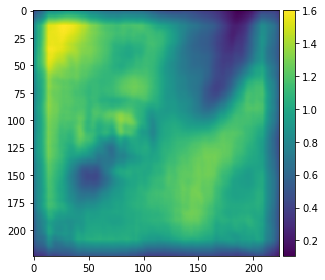

2


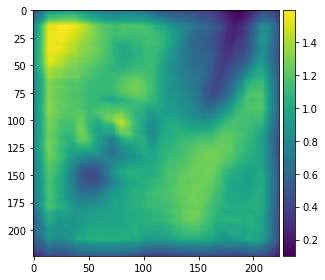

3


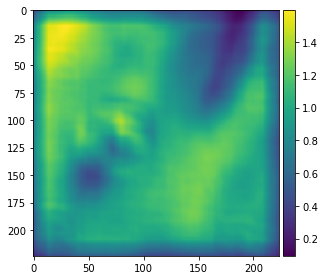

4


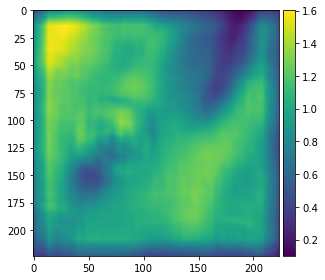

5


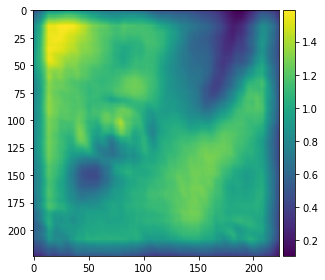

6


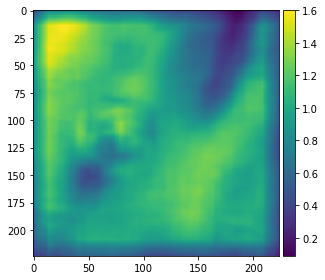

7


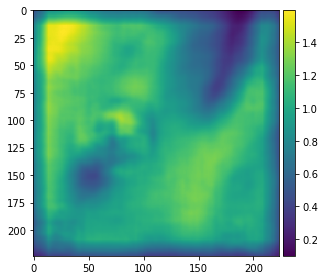

8


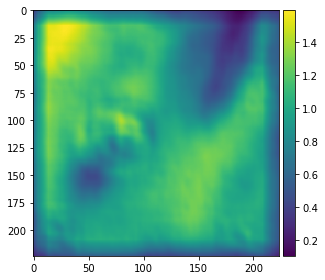

9


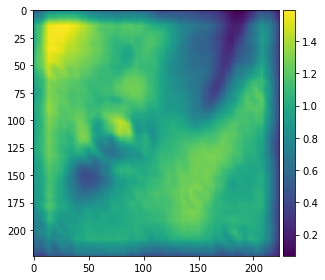

10


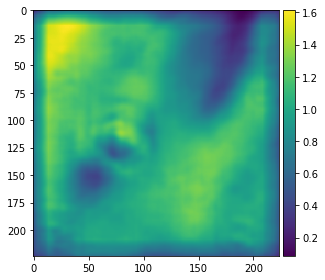

11


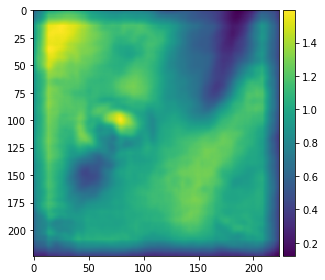

12


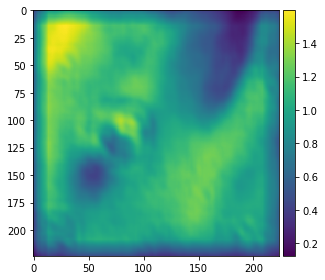

13


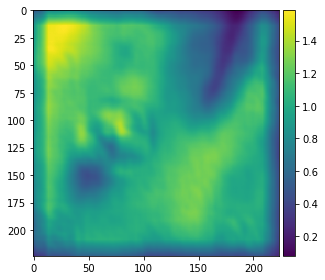

14


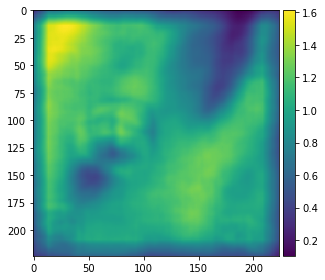

15


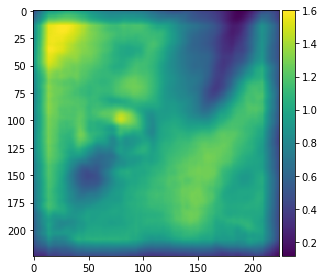

16


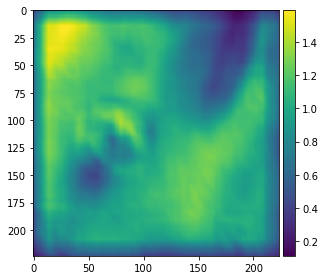

17


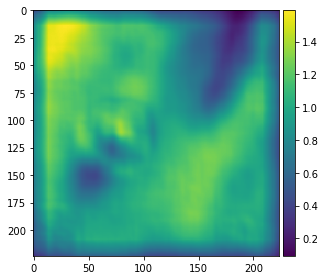

18


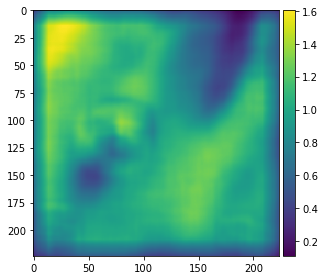

19


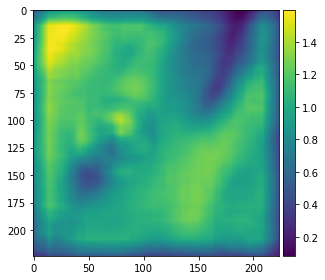

20


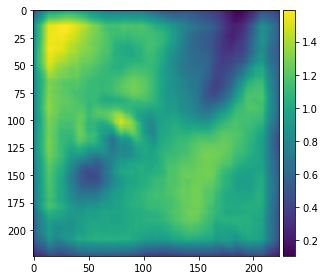

21


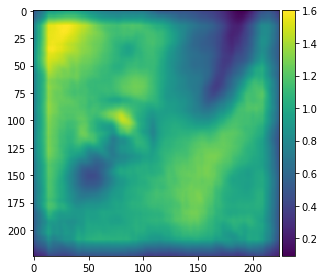

22


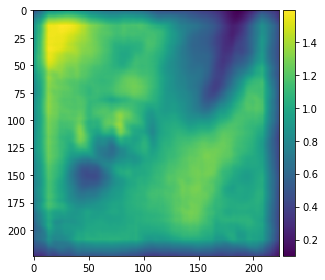

23


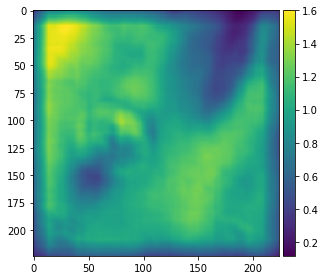

24


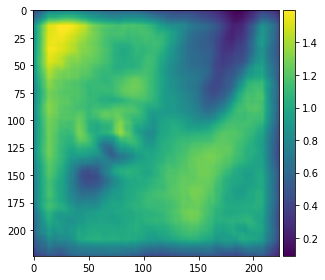

25


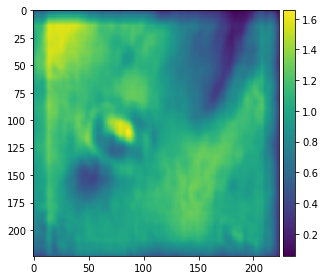

26


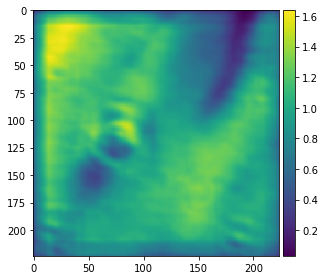

27


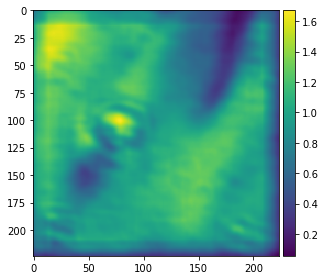

28


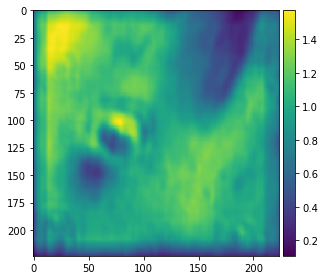

29


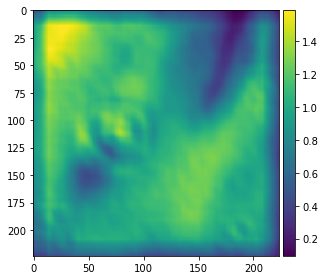

30


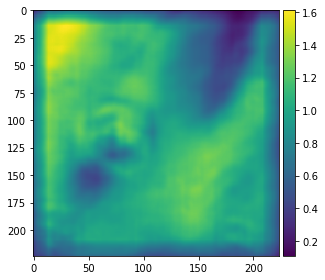

31


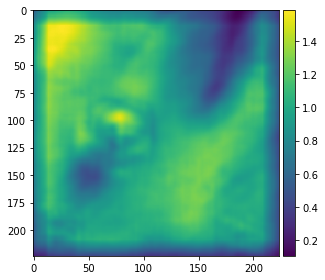

32


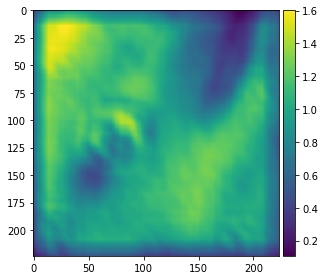

33


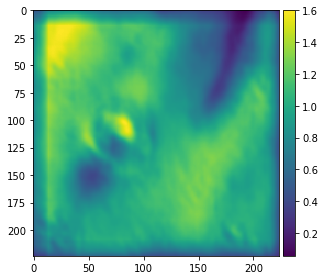

34


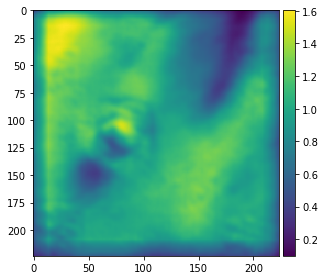

35


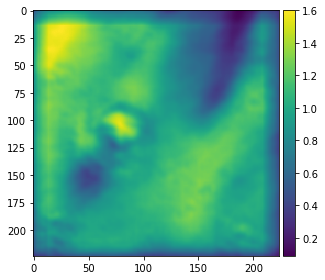

36


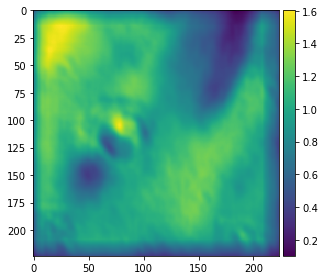

37


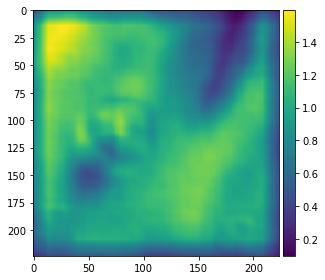

38


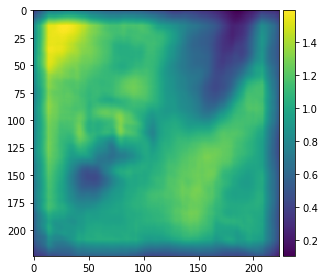

39


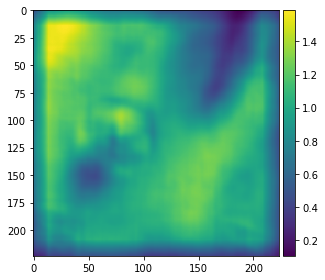

40


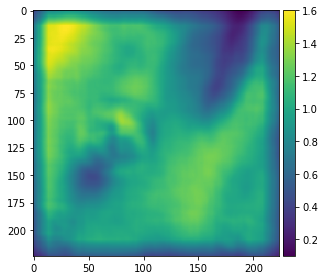

41


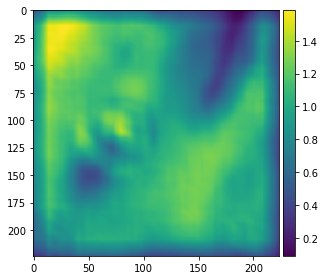

42


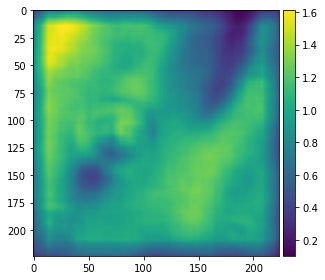

43


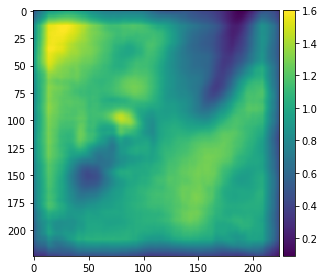

44


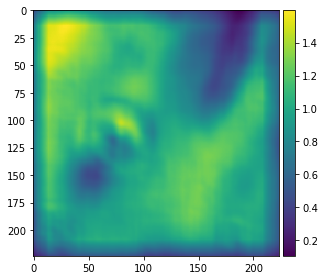

45


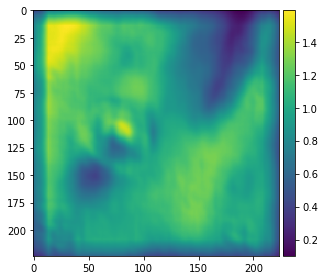

46


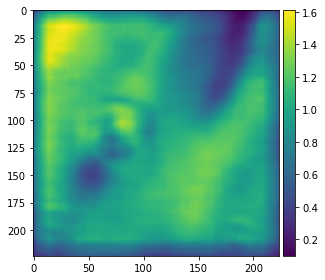

47


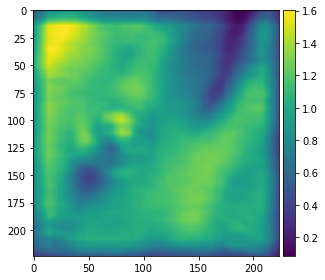

48


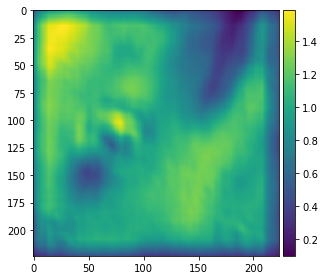

49


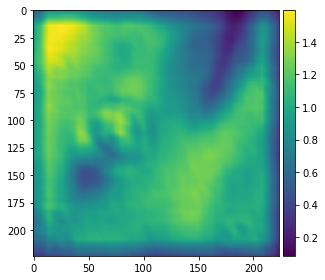

50


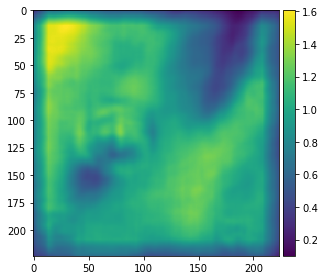

51


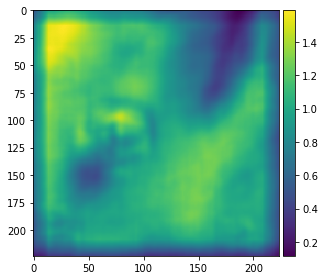

52


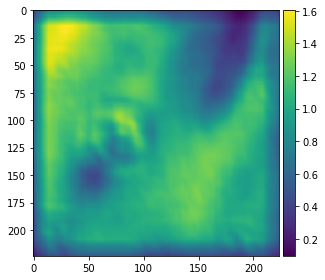

53


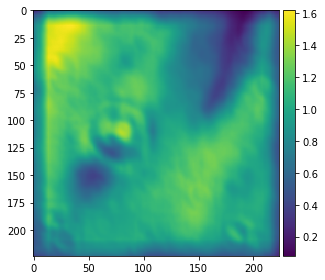

54


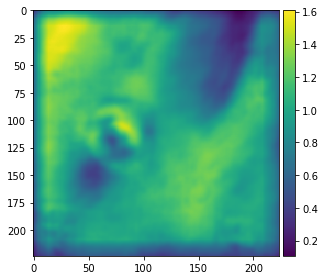

55


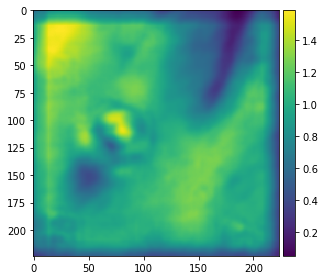

56


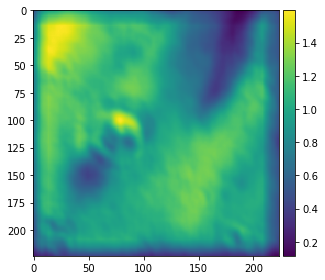

57


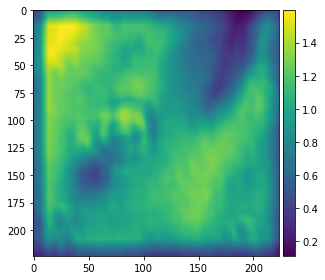

58


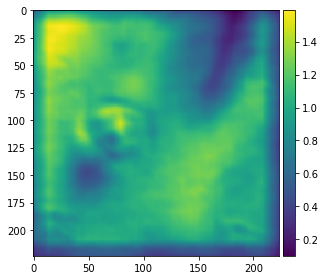

59


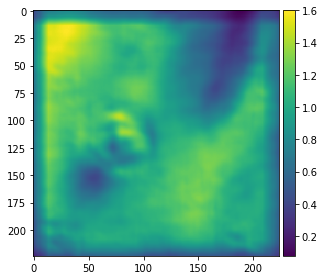

60


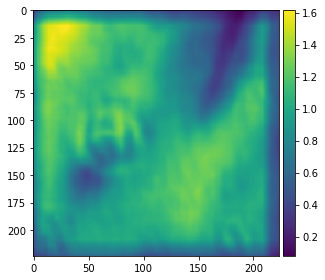

61


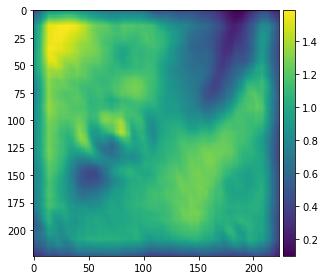

62


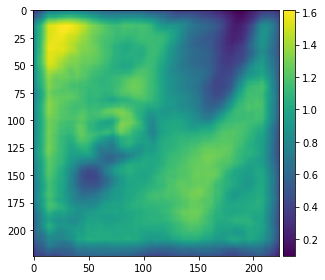

63


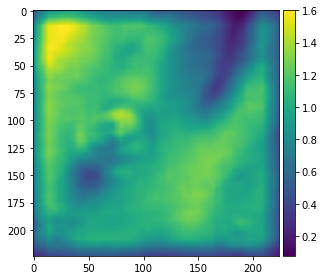

64


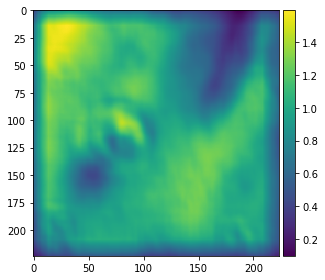

65


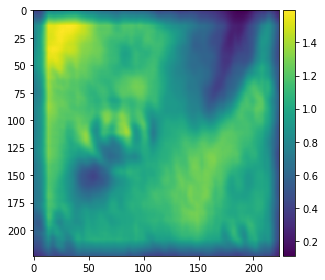

66


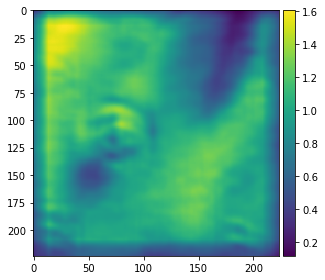

67


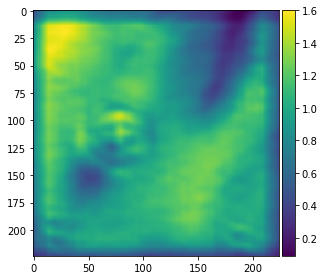

68


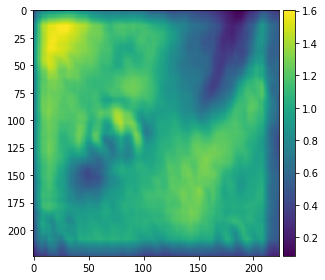

69


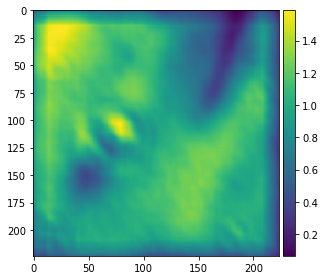

70


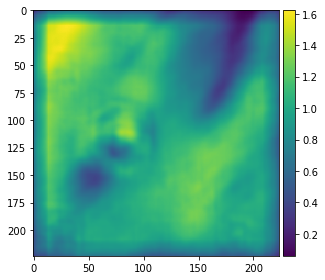

71


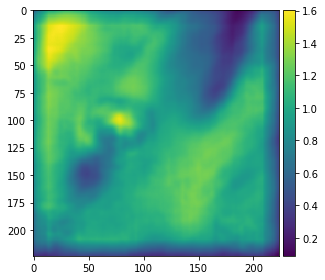

72


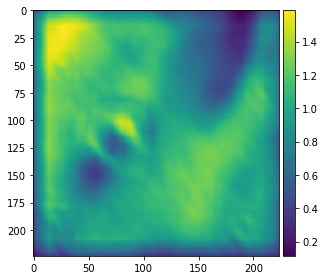

73


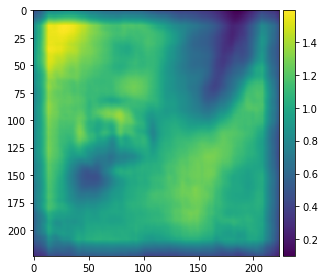

74


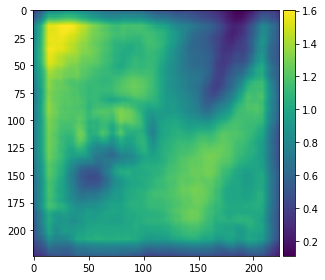

75


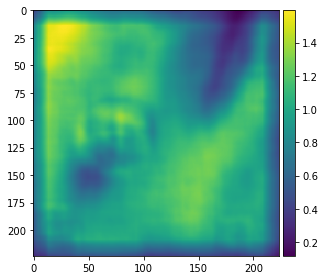

76


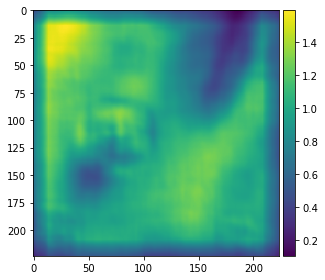

77


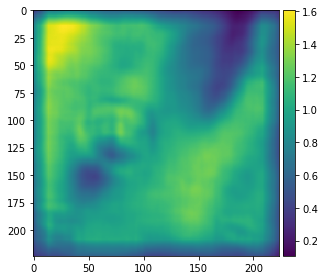

78


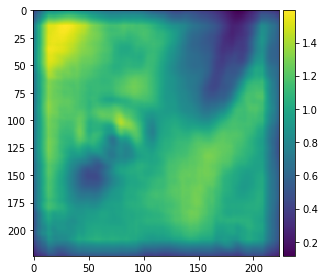

79


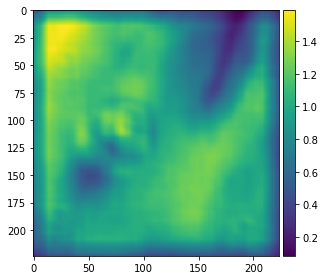

80


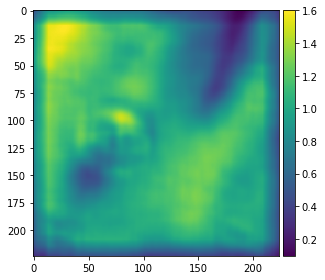

81


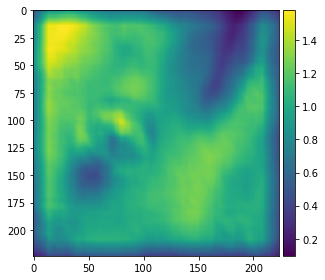

82


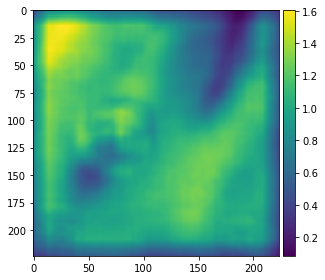

83


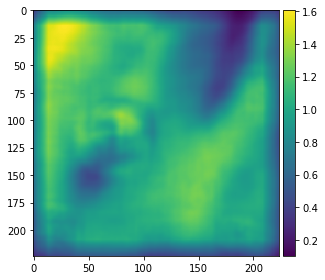

84


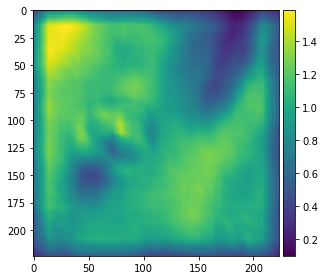

85


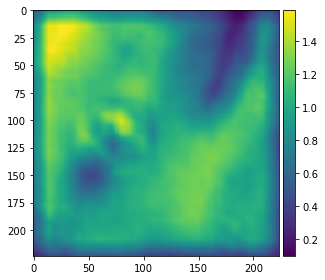

86


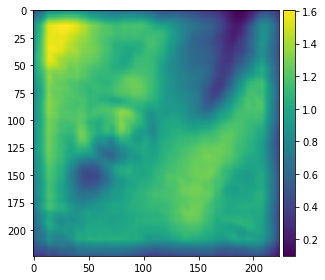

87


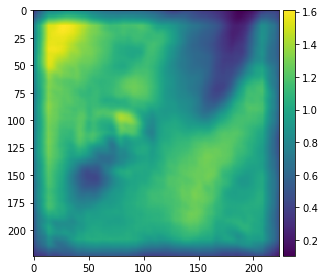

88


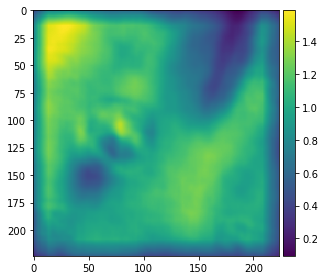

89


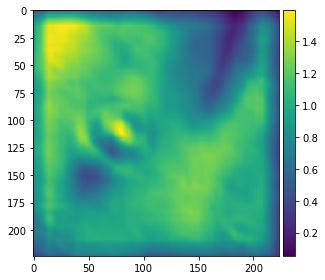

90


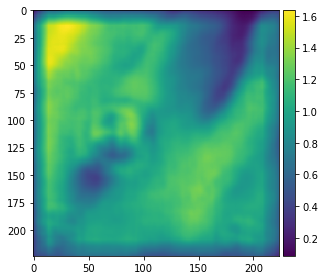

91


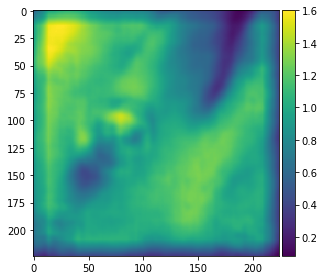

92


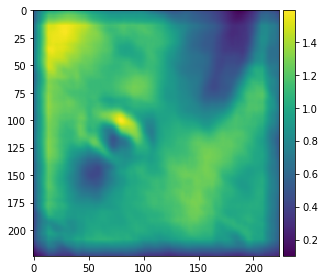

93


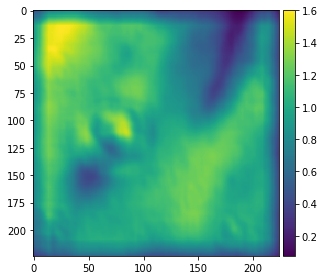

94


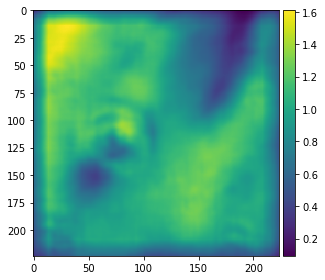

95


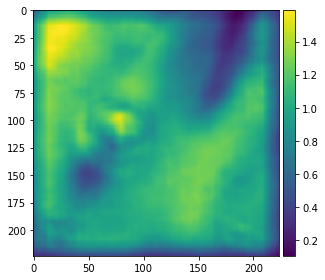

96


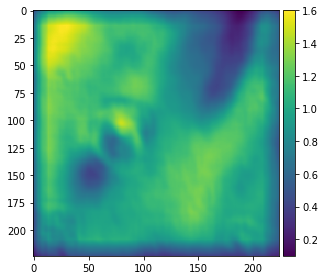

97


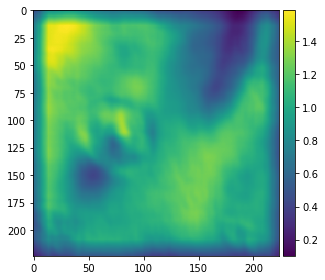

98


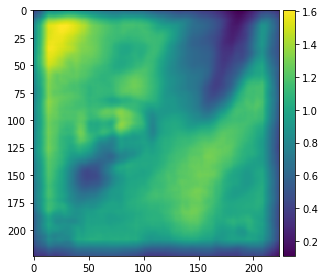

99


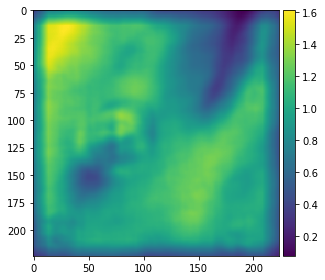

100


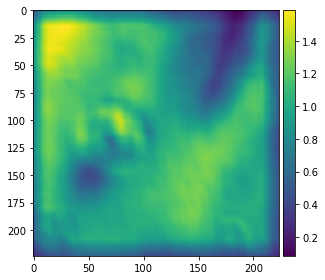

101


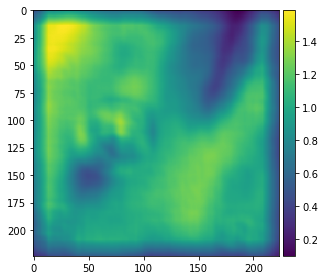

102


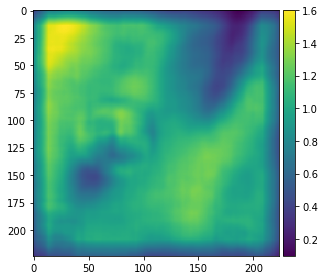

103


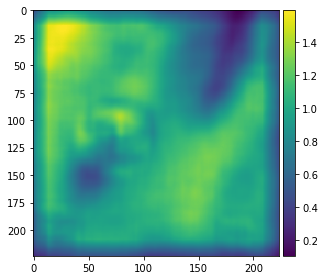

104


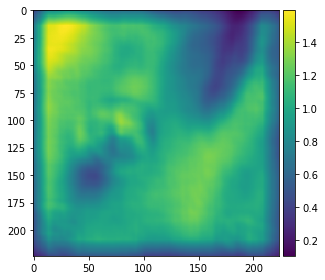

105


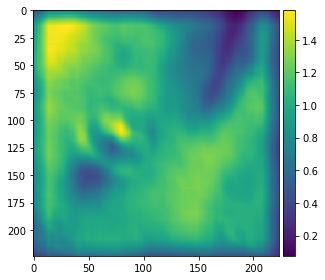

106


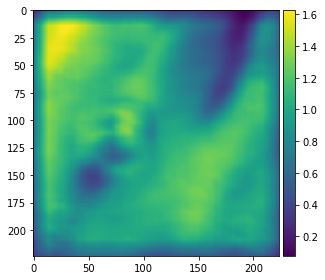

107


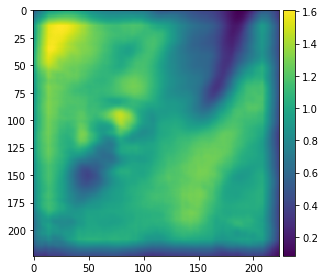

108


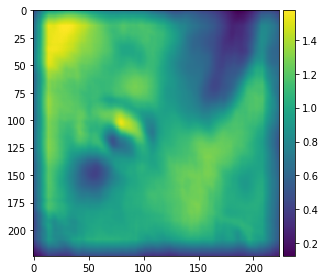

109


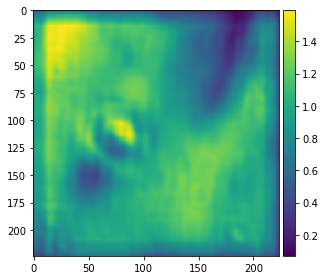

110


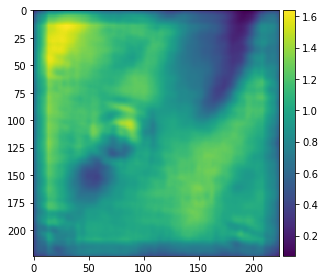

111


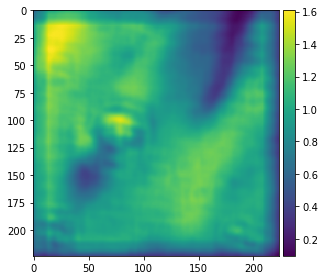

112


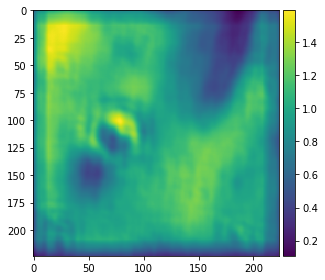

113


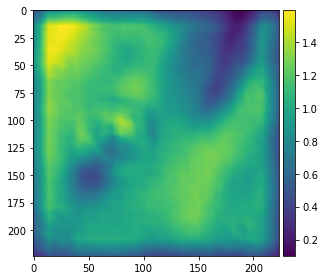

114


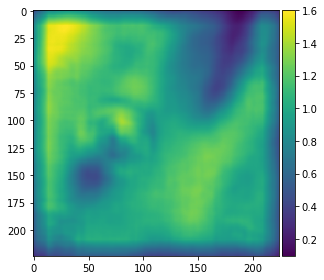

115


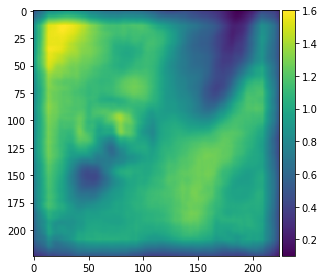

116


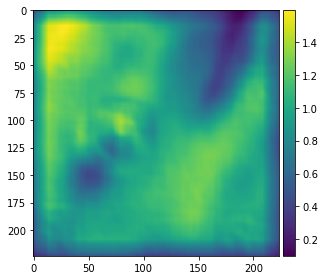

117


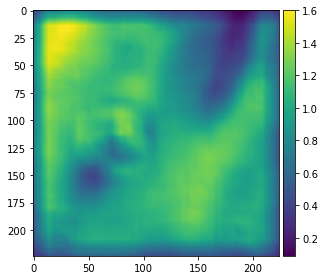

118


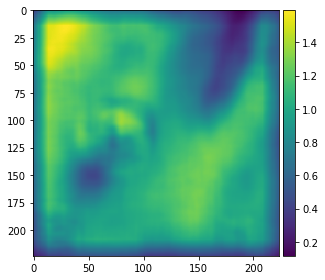

119


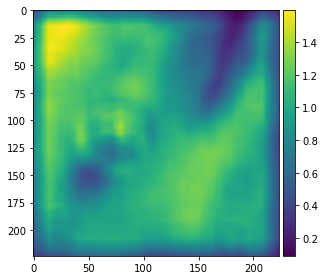

120


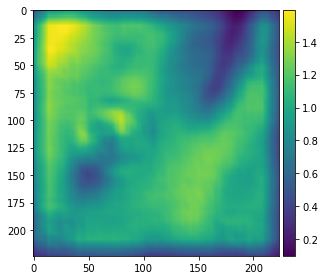

121


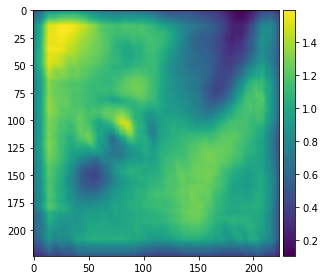

122


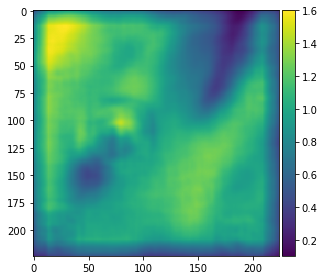

123


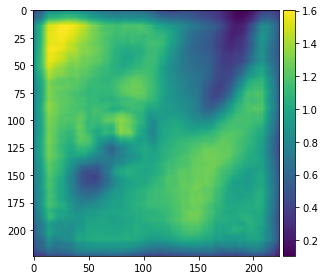

124


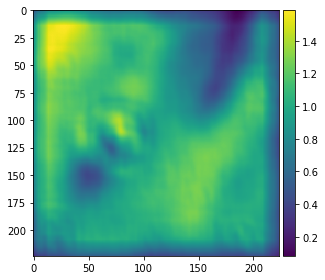

125


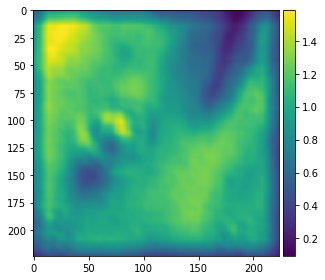

126


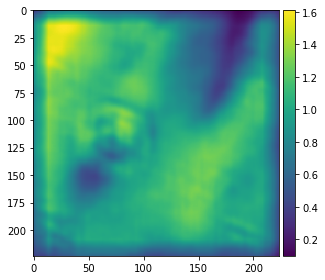

127


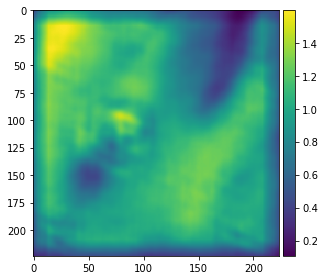

128


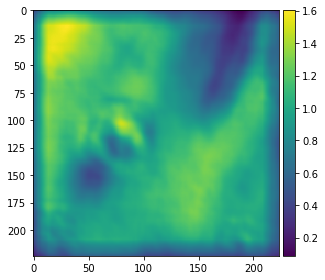

129


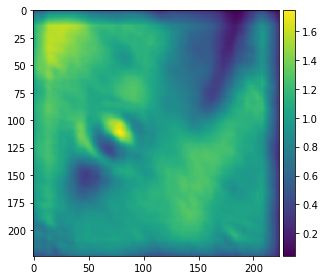

130


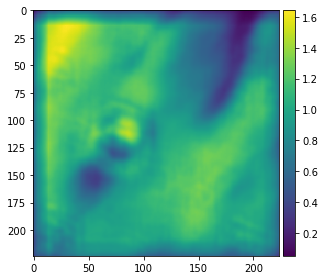

131


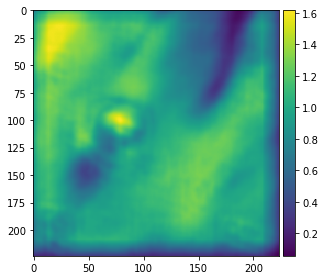

132


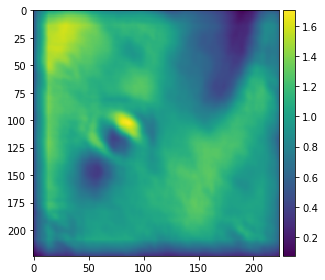

133


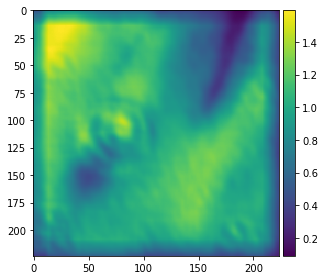

134


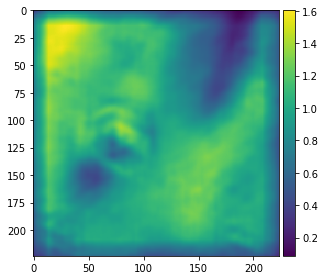

135


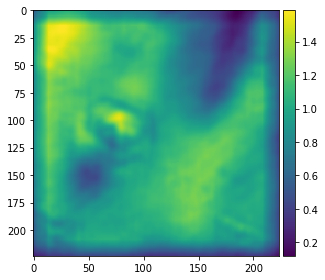

136


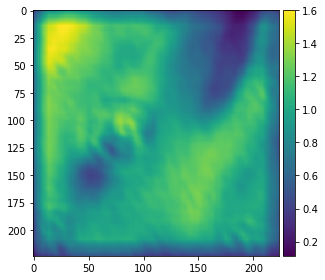

137


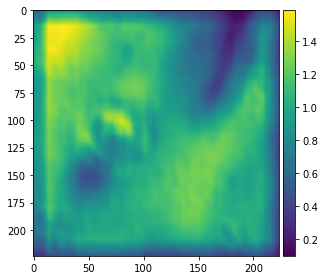

138


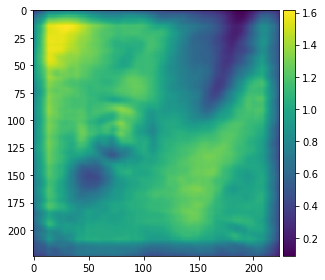

139


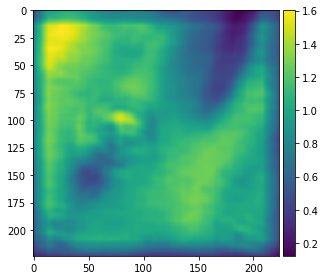

140


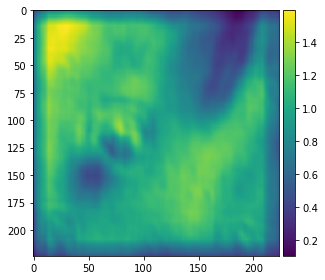

141


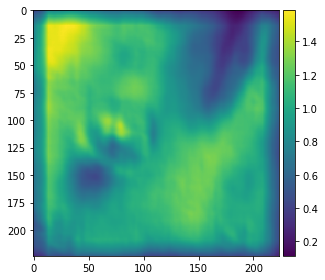

142


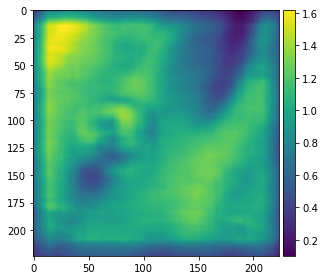

143


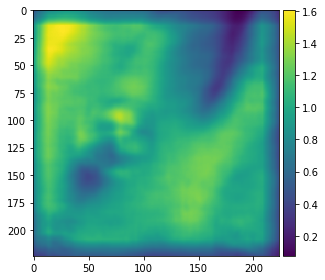

144


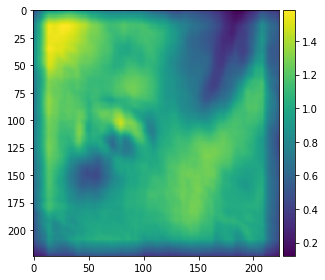

145


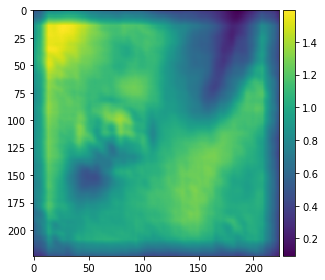

146


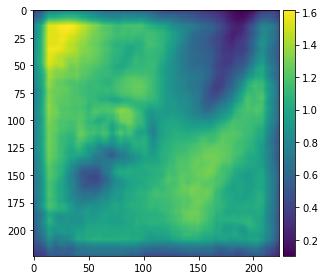

147


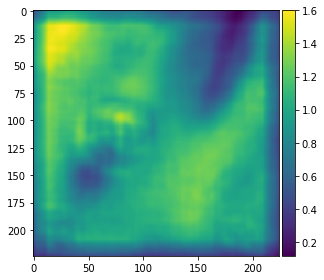

148


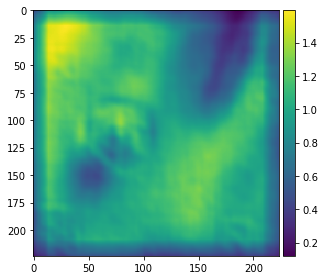

149


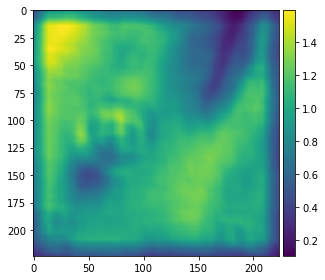

150


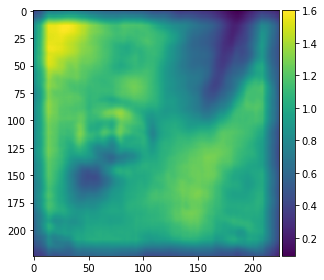

151


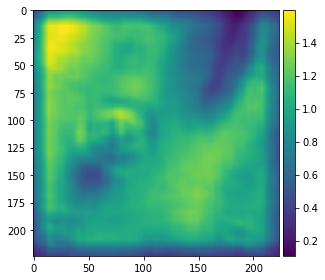

152


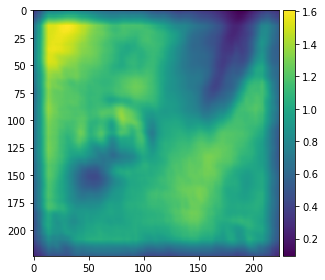

153


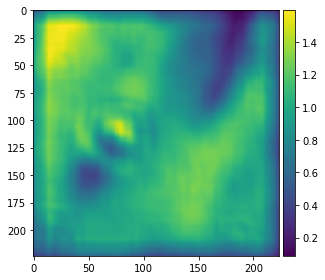

154


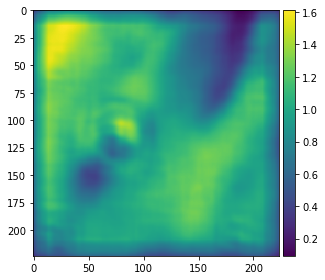

155


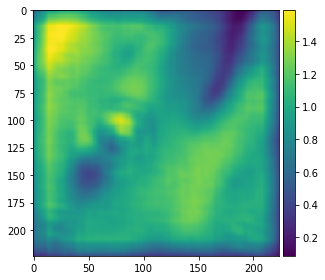

156


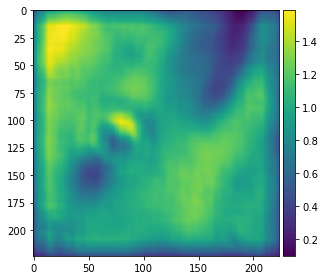

157


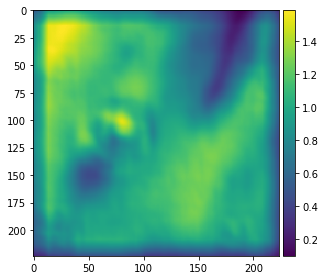

158


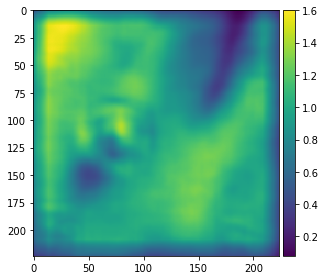

159


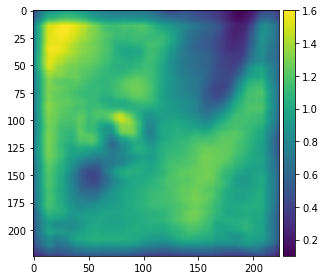

160


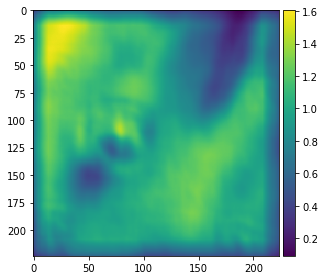

161


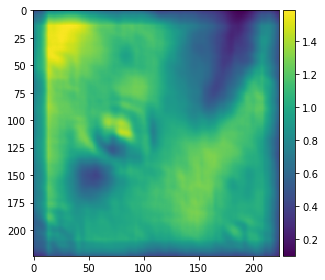

162


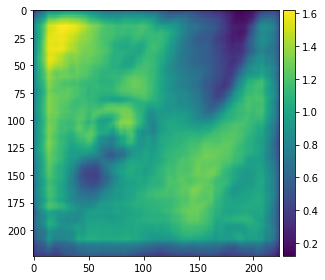

163


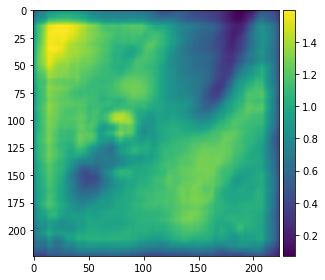

164


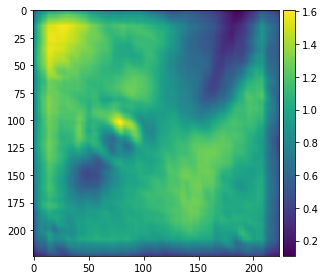

165


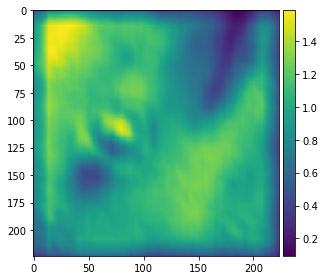

166


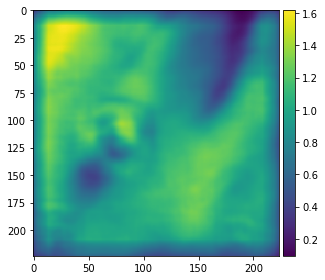

167


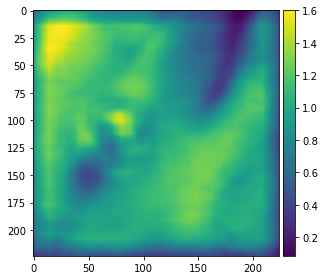

168


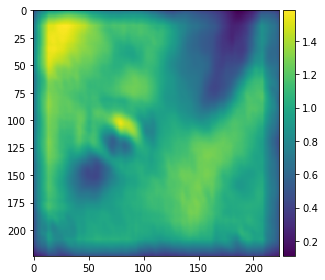

169


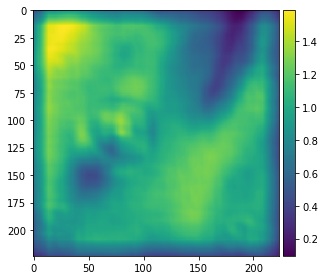

170


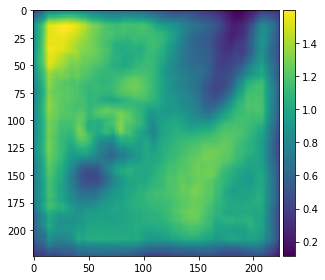

171


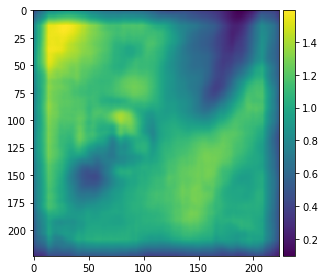

172


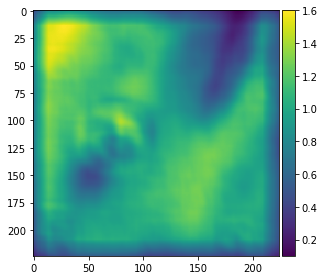

173


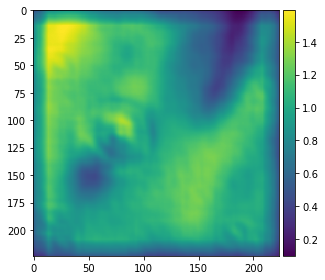

174


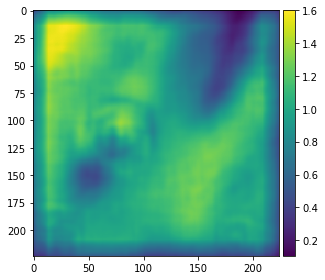

175


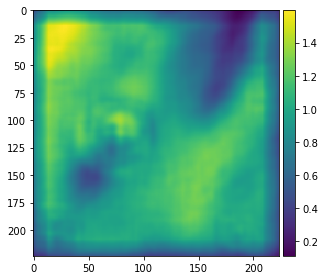

176


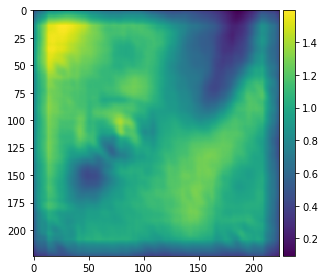

177


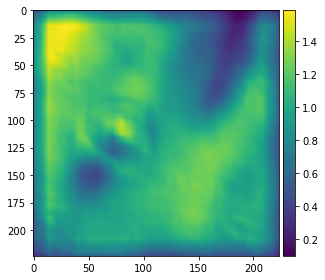

178


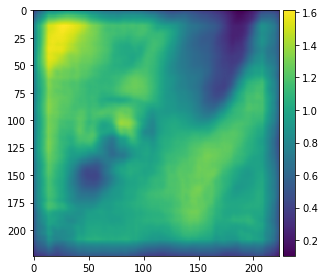

179


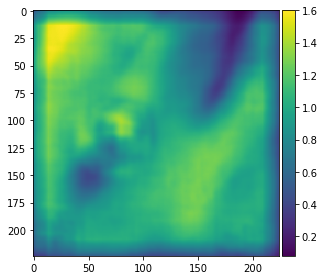

180


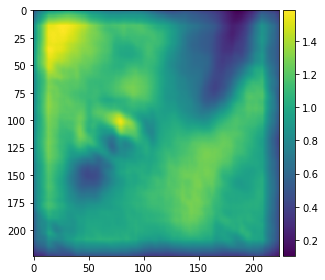

181


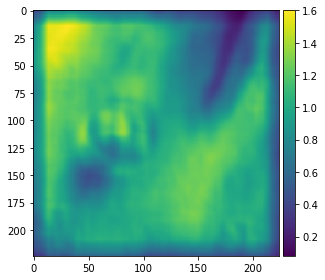

182


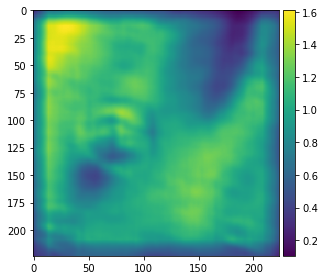

183


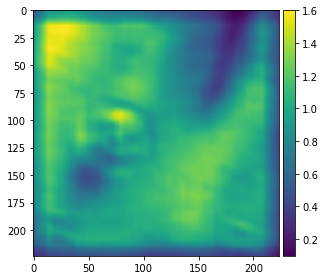

184


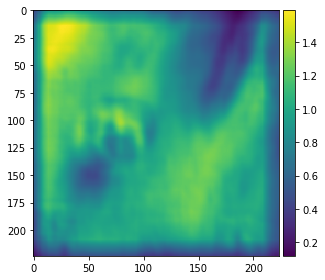

185


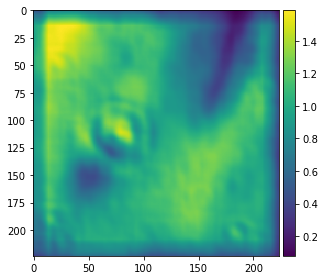

186


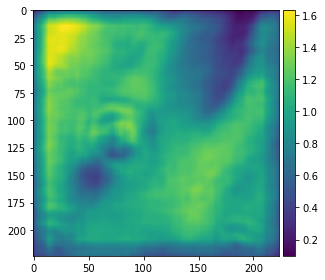

187


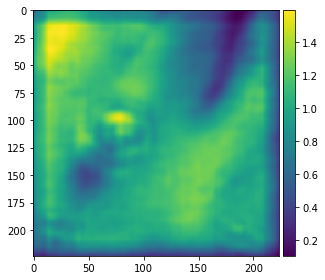

188


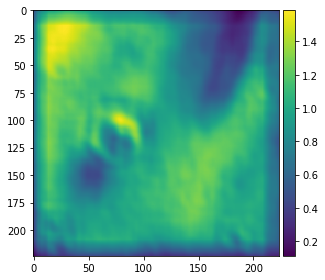

189


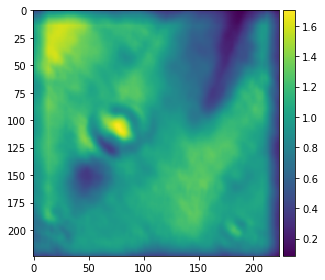

190


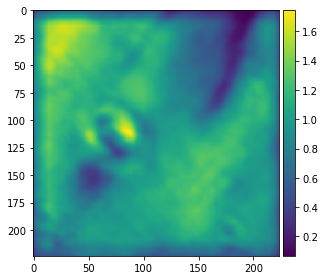

191


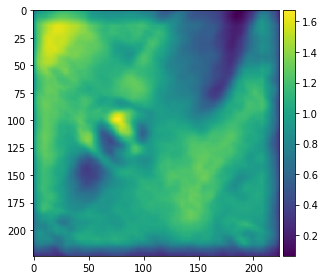

192


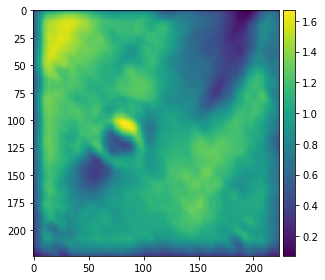

193


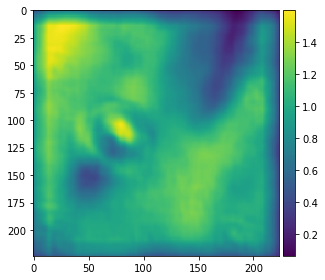

194


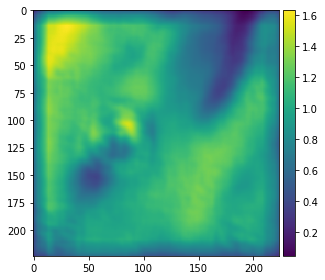

195


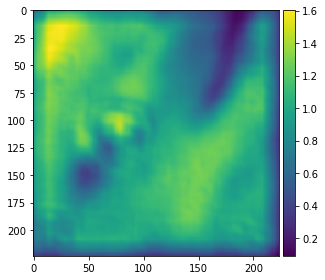

196


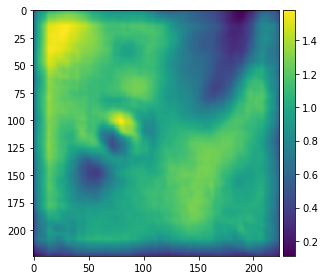

197


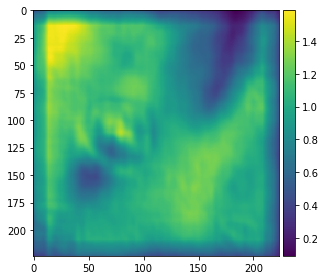

198


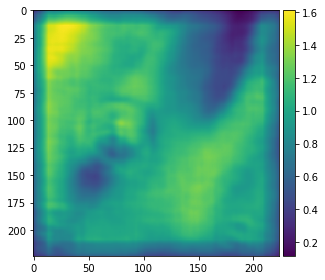

199


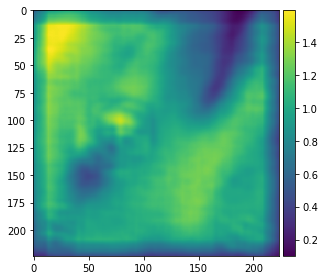

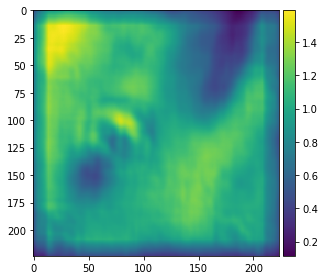

In [46]:
for i in range(len(max_correlation)):
    print(i)
    plt.show()
    imshow(max_correlation[i])

In [1]:
import numpy as np
from problem import get_train_data

X_train, y_train = get_train_data()
X_train = np.array(X_train)

In [2]:
from submissions.image_processing.object_detector import CraterDetector
from submissions.image_processing.extraction import BlobExtractor
from imblearn.ensemble import BalancedBaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier

In [3]:
clf = CraterDetector(extractor=BlobExtractor(iou_threshold=0.4, max_radius=30, overlap=0.2, padding=2.0),
                     estimator=GradientBoostingClassifier(n_estimators=100),
                     n_jobs=1)

In [4]:
clf.fit(X_train, y_train)

/home/lemaitre/miniconda3/lib/python3.6/site-packages/mahotas/features/zernike.py:78: RuntimeWarning: invalid value encountered in less_equal
  k = (Dn <= 1.)


In [5]:
from problem import get_test_data
X_test, y_test = get_test_data()
X_test = np.array(X_test)

In [6]:
y_pred = clf.predict(X_test)

/home/lemaitre/miniconda3/lib/python3.6/site-packages/mahotas/features/zernike.py:78: RuntimeWarning: invalid value encountered in less_equal
  k = (Dn <= 1.)


In [7]:
from workflow.scores import Precision, Recall

In [8]:
precision = Precision()
recall = Recall()

In [9]:
precision(y_test, y_pred)

1.0

In [10]:
recall(y_test, y_pred)

0.8045977011494253

In [4]:
%matplotlib inline

In [5]:
import matplotlib.pyplot as plt
import numpy as np

from skimage.draw import circle_perimeter
from skimage import data, color

def plot_prediction(X, y_true, y_pred, i=None):
    if i is not None:
        img_orig = X[i]
        true = y_true[i]
        pred = y_pred[i]
    else:
        img_orig = X
        true = y_true
        pred = y_pred
    
    
    # print("Score: ", score_craters_on_patch(true, pred))
    
    fig, ax = plt.subplots(ncols=2, nrows=1, figsize=(12, 6))
    
    ax[0].imshow(img_orig, cmap=plt.cm.gray)
    
    p = 50

    img = np.zeros((224 + p*2, 224 + p*2))
    img = color.gray2rgb(img)

    for center_y, center_x, radius, prob in pred:
        if prob > 0.5:
            circy, circx = circle_perimeter(int(center_y) + p, int(center_x) + p, int(radius))
            img[circy, circx] = (220, 20, 20)

    for center_y, center_x, radius in true:
        circy, circx = circle_perimeter(int(center_y) + p, int(center_x) + p, int(radius))
        img[circy, circx] = (20, 220, 20)
        
    ax[1].imshow(img)
    
    return fig, ax

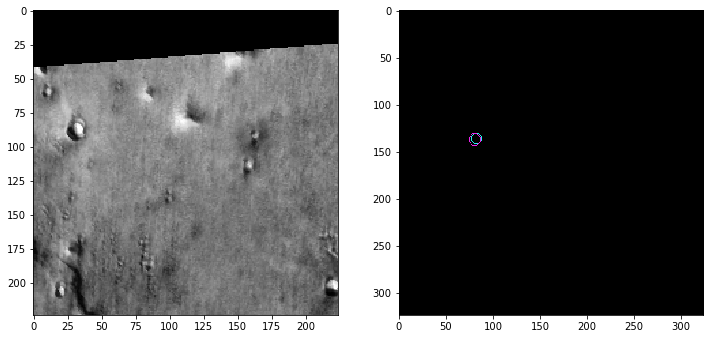

In [6]:
fig, ax = plot_prediction(X_test, y_test, y_pred, 71)

In [91]:
y_pred[1000]

[(147.0, 60.0, 5.0, 0.33333333333333337)]

In [92]:
y_train[1000]

[]

# Test script

In [2]:
import numpy as np

from sklearn.ensemble import GradientBoostingClassifier

from problem import get_train_data, get_test_data

from submissions.image_processing.object_detector import ObjectDetector
from submissions.image_processing.object_detector import BlobExtractor

from workflow.scores import Precision, Recall

X_train, y_train = get_train_data()
#X_train = np.array(X_train)
X_test, y_test = get_test_data()
#X_test = np.array(X_test)

#clf = ObjectDetector(extractor=BlobExtractor(iou_threshold=0.4, max_radius=30, overlap=0.2, padding=2.0),
#                     estimator=GradientBoostingClassifier(n_estimators=100),
#                     n_jobs=-1)
clf = ObjectDetector(n_jobs=-1)

clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

precision, recall = Precision(), Recall()
print('Precision: {} - Recall: {} '.format(precision(y_test, y_pred),
                                           recall(y_test, y_pred)))

Precision: 0.5147058823529411 - Recall: 0.8045977011494253 
